In [2]:
# Chargement des données propres IDF
import pandas as pd

df = pd.read_csv("data/idf_propre.csv")

print(f"✅ {len(df):,} transactions chargées")
print(f"Colonnes disponibles : {list(df.columns)}")
df.head(3)


✅ 127,466 transactions chargées
Colonnes disponibles : ['id_mutation', 'date_mutation', 'nature_mutation', 'valeur_fonciere', 'type_local', 'surface_reelle_bati', 'nombre_pieces_principales', 'adresse_nom_voie', 'code_postal', 'nom_commune', 'code_departement', 'departement', 'longitude', 'latitude', 'prix_m2']


,id_mutation,date_mutation,nature_mutation,valeur_fonciere,type_local,surface_reelle_bati,nombre_pieces_principales,adresse_nom_voie,code_postal,nom_commune,code_departement,departement,longitude,latitude,prix_m2
0,2024-1193218,2024-01-04,Vente,1042000.0,Appartement,86.0,4.0,VLA PERREUR,75020.0,Paris 20e Arrondissement,75,75,2.405228,48.868216,12116.279070
1,2024-1193219,2024-01-04,Vente,299120.0,Appartement,36.0,3.0,RUE DU ROI D ALGER,75018.0,Paris 18e Arrondissement,75,75,2.347665,48.895338,8308.888889
2,2024-1193220,2024-01-03,Vente,426471.0,Appartement,42.0,1.0,AV PARMENTIER,75010.0,Paris 10e Arrondissement,75,75,2.370282,48.871532,10154.071429


=== Prix au m² par type de bien (Île-de-France 2024) ===
             nombre  prix_moyen  prix_median  prix_min  prix_max
type_local                                                      
Appartement   89471      7898.0       6214.0    1000.0   50000.0
Maison        37995      4489.0       3580.0    1000.0   50000.0


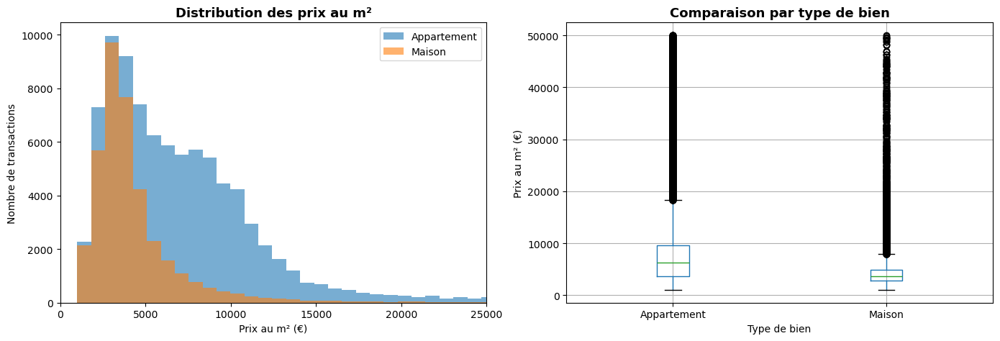

In [3]:
# DVF2-1 — Distribution des prix au m² par type de bien
import matplotlib.pyplot as plt

# Statistiques de base par type de bien
stats = df.groupby("type_local")["prix_m2"].agg(
    nombre="count",
    prix_moyen="mean",
    prix_median="median",
    prix_min="min",
    prix_max="max"
).round(0)

print("=== Prix au m² par type de bien (Île-de-France 2024) ===")
print(stats.to_string())

# Visualisation
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Graphique 1 — Histogramme des prix
for type_bien, groupe in df.groupby("type_local"):
    axes[0].hist(groupe["prix_m2"], bins=60, alpha=0.6, label=type_bien)

axes[0].set_title("Distribution des prix au m²", fontsize=13, fontweight="bold")
axes[0].set_xlabel("Prix au m² (€)")
axes[0].set_ylabel("Nombre de transactions")
axes[0].legend()
axes[0].set_xlim(0, 25000)

# Graphique 2 — Boxplot comparatif
df.boxplot(column="prix_m2", by="type_local", ax=axes[1])
axes[1].set_title("Comparaison par type de bien", fontsize=13, fontweight="bold")
axes[1].set_xlabel("Type de bien")
axes[1].set_ylabel("Prix au m² (€)")
plt.suptitle("")

plt.tight_layout()
plt.show()


=== Prix au m² par type de bien (Île-de-France 2024) ===
             nombre  prix_moyen  prix_median  prix_min  prix_max
type_local                                                      
Appartement   89471      7898.0       6214.0    1000.0   50000.0
Maison        37995      4489.0       3580.0    1000.0   50000.0


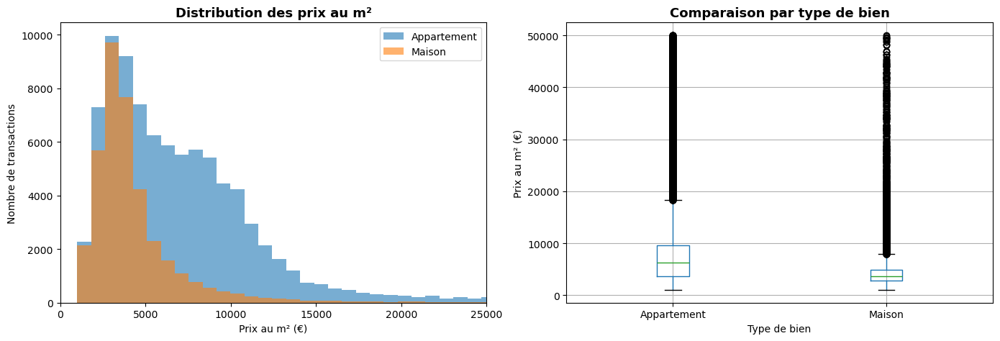

In [4]:
# DVF2-1 — Distribution des prix au m² par type de bien
import matplotlib.pyplot as plt

# Statistiques de base par type de bien
stats = df.groupby("type_local")["prix_m2"].agg(
    nombre="count",
    prix_moyen="mean",
    prix_median="median",
    prix_min="min",
    prix_max="max"
).round(0)

print("=== Prix au m² par type de bien (Île-de-France 2024) ===")
print(stats.to_string())

# Visualisation
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Graphique 1 — Histogramme des prix
for type_bien, groupe in df.groupby("type_local"):
    axes[0].hist(groupe["prix_m2"], bins=60, alpha=0.6, label=type_bien)

axes[0].set_title("Distribution des prix au m²", fontsize=13, fontweight="bold")
axes[0].set_xlabel("Prix au m² (€)")
axes[0].set_ylabel("Nombre de transactions")
axes[0].legend()
axes[0].set_xlim(0, 25000)

# Graphique 2 — Boxplot comparatif
df.boxplot(column="prix_m2", by="type_local", ax=axes[1])
axes[1].set_title("Comparaison par type de bien", fontsize=13, fontweight="bold")
axes[1].set_xlabel("Type de bien")
axes[1].set_ylabel("Prix au m² (€)")
plt.suptitle("")

plt.tight_layout()
plt.show()

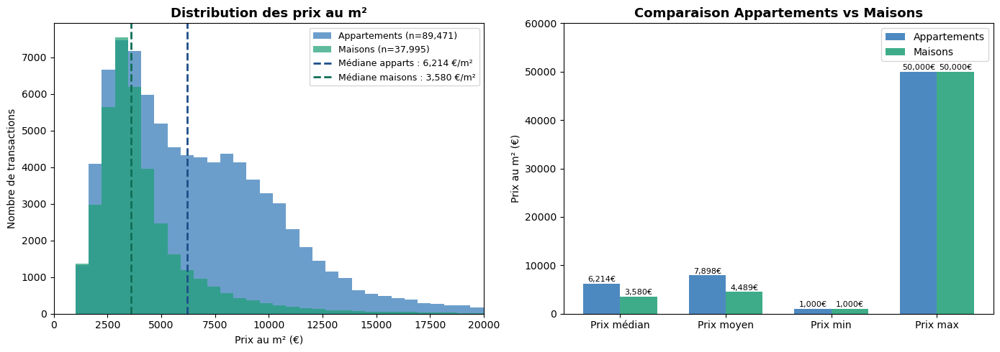

In [5]:
# DVF2-1 — Visualisations améliorées
import matplotlib.pyplot as plt
import numpy as np

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# --- Graphique 1 : Histogramme séparé par type ---
apparts = df[df["type_local"] == "Appartement"]["prix_m2"]
maisons = df[df["type_local"] == "Maison"]["prix_m2"]

axes[0].hist(apparts, bins=80, alpha=0.7, color="#2E75B6", label=f"Appartements (n={len(apparts):,})")
axes[0].hist(maisons, bins=80, alpha=0.7, color="#1D9E75", label=f"Maisons (n={len(maisons):,})")

# Lignes verticales pour les médianes
axes[0].axvline(apparts.median(), color="#1D4E89", linestyle="--", linewidth=2, label=f"Médiane apparts : {apparts.median():,.0f} €/m²")
axes[0].axvline(maisons.median(), color="#0F6E56", linestyle="--", linewidth=2, label=f"Médiane maisons : {maisons.median():,.0f} €/m²")

axes[0].set_title("Distribution des prix au m²", fontsize=13, fontweight="bold")
axes[0].set_xlabel("Prix au m² (€)")
axes[0].set_ylabel("Nombre de transactions")
axes[0].set_xlim(0, 20000)
axes[0].legend(fontsize=9)

# --- Graphique 2 : Barres comparatives des statistiques clés ---
categories = ["Prix médian", "Prix moyen", "Prix min", "Prix max"]
valeurs_apparts = [apparts.median(), apparts.mean(), apparts.min(), apparts.max()]
valeurs_maisons = [maisons.median(), maisons.mean(), maisons.min(), maisons.max()]

x = np.arange(len(categories))
largeur = 0.35

bars1 = axes[1].bar(x - largeur/2, valeurs_apparts, largeur, label="Appartements", color="#2E75B6", alpha=0.85)
bars2 = axes[1].bar(x + largeur/2, valeurs_maisons, largeur, label="Maisons", color="#1D9E75", alpha=0.85)

# Afficher les valeurs sur chaque barre
for bar in bars1:
    h = bar.get_height()
    axes[1].text(bar.get_x() + bar.get_width()/2, h + 100, f"{h:,.0f}€", ha="center", va="bottom", fontsize=8)
for bar in bars2:
    h = bar.get_height()
    axes[1].text(bar.get_x() + bar.get_width()/2, h + 100, f"{h:,.0f}€", ha="center", va="bottom", fontsize=8)

axes[1].set_title("Comparaison Appartements vs Maisons", fontsize=13, fontweight="bold")
axes[1].set_xticks(x)
axes[1].set_xticklabels(categories)
axes[1].set_ylabel("Prix au m² (€)")
axes[1].set_ylim(0, 60000)
axes[1].legend()

plt.tight_layout()
plt.show()

In [6]:
# DVF2-2 — Évolution temporelle

# Étape 1 : convertir la date en vrai format date
df["date_mutation"] = pd.to_datetime(df["date_mutation"])

# Étape 2 : extraire le mois et l'année
df["mois"] = df["date_mutation"].dt.month
df["mois_label"] = df["date_mutation"].dt.strftime("%b %Y")
df["trimestre"] = df["date_mutation"].dt.quarter

# Vérification
print("Type de la colonne date :", df["date_mutation"].dtype)
print("\nAperçu des nouvelles colonnes :")
df[["date_mutation", "mois", "mois_label", "trimestre"]].head(5)

Type de la colonne date : datetime64[ns]

Aperçu des nouvelles colonnes :


,date_mutation,mois,mois_label,trimestre
0,2024-01-04,1,Jan 2024,1
1,2024-01-04,1,Jan 2024,1
2,2024-01-03,1,Jan 2024,1
3,2024-01-08,1,Jan 2024,1
4,2024-01-08,1,Jan 2024,1


nom_mois  nombre_ventes  prix_median
     Jan           8546  5170.454545
     Fév           8603  4875.000000
     Mar          10998  5765.564620
     Avr           9774  5215.370019
     Mai           9509  4892.857143
     Jun          11731  4948.979592
     Jul          14449  4812.500000
     Aoû           7422  4210.526316
     Sep          12995  5088.541667
     Oct          12391  4910.400000
     Nov           8472  4661.153636
     Déc          12576  4732.945736


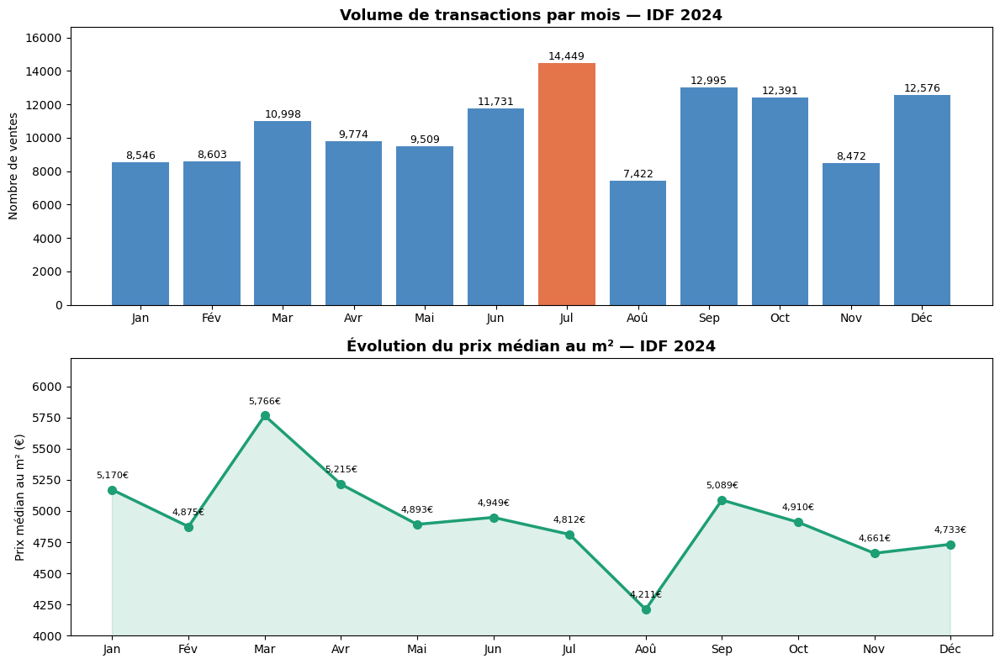

In [7]:
# DVF2-2 — Graphiques évolution temporelle
import matplotlib.pyplot as plt

# Calcul du volume et prix médian par mois
par_mois = df.groupby("mois").agg(
    nombre_ventes=("id_mutation", "count"),
    prix_median=("prix_m2", "median")
).reset_index()

noms_mois = ["Jan", "Fév", "Mar", "Avr", "Mai", "Jun",
             "Jul", "Aoû", "Sep", "Oct", "Nov", "Déc"]
par_mois["nom_mois"] = par_mois["mois"].apply(lambda x: noms_mois[x-1])

print(par_mois[["nom_mois", "nombre_ventes", "prix_median"]].to_string(index=False))

# Visualisation
fig, axes = plt.subplots(2, 1, figsize=(12, 8))

# Graphique 1 — Volume de ventes par mois
couleurs = ["#2E75B6" if m != par_mois["nombre_ventes"].idxmax() 
            else "#E05C2A" for m in par_mois.index]
bars = axes[0].bar(par_mois["nom_mois"], par_mois["nombre_ventes"], 
                   color=couleurs, alpha=0.85)

# Valeurs sur les barres
for bar in bars:
    h = bar.get_height()
    axes[0].text(bar.get_x() + bar.get_width()/2, h + 50, 
                f"{h:,}", ha="center", va="bottom", fontsize=9)

axes[0].set_title("Volume de transactions par mois — IDF 2024", 
                  fontsize=13, fontweight="bold")
axes[0].set_ylabel("Nombre de ventes")
axes[0].set_ylim(0, par_mois["nombre_ventes"].max() * 1.15)

# Graphique 2 — Prix médian par mois
axes[1].plot(par_mois["nom_mois"], par_mois["prix_median"], 
             color="#1D9E75", linewidth=2.5, marker="o", markersize=7)

# Zone colorée sous la courbe
axes[1].fill_between(par_mois["nom_mois"], par_mois["prix_median"], 
                     alpha=0.15, color="#1D9E75")

# Valeurs sur chaque point
for i, row in par_mois.iterrows():
    axes[1].annotate(f"{row['prix_median']:,.0f}€", 
                     (row["nom_mois"], row["prix_median"]),
                     textcoords="offset points", xytext=(0, 10),
                     ha="center", fontsize=8)

axes[1].set_title("Évolution du prix médian au m² — IDF 2024", 
                  fontsize=13, fontweight="bold")
axes[1].set_ylabel("Prix médian au m² (€)")
axes[1].set_ylim(par_mois["prix_median"].min() * 0.95, 
                 par_mois["prix_median"].max() * 1.08)

plt.tight_layout()
plt.show()

In [8]:
# DVF2-3 — Corrélation prix / surface

# Créer des tranches de surface
bins = [0, 30, 50, 70, 100, 150, 200, 500]
labels = ["< 30m²", "30-50m²", "50-70m²", "70-100m²", 
          "100-150m²", "150-200m²", "> 200m²"]

df["tranche_surface"] = pd.cut(
    df["surface_reelle_bati"], 
    bins=bins, 
    labels=labels
)

# Statistiques par tranche
stats = df.groupby("tranche_surface", observed=True)["prix_m2"].agg(
    nombre="count",
    prix_median="median",
    prix_moyen="mean"
).round(0)

print("=== Prix au m² selon la surface du bien ===")
print(stats.to_string())


=== Prix au m² selon la surface du bien ===
                 nombre  prix_median  prix_moyen
tranche_surface                                 
< 30m²            18694       8392.0     10040.0
30-50m²           28448       6271.0      7748.0
50-70m²           29310       4522.0      6093.0
70-100m²          29776       3877.0      5913.0
100-150m²         15791       3560.0      5235.0
150-200m²          3859       3618.0      5448.0
> 200m²            1588       4211.0      6777.0


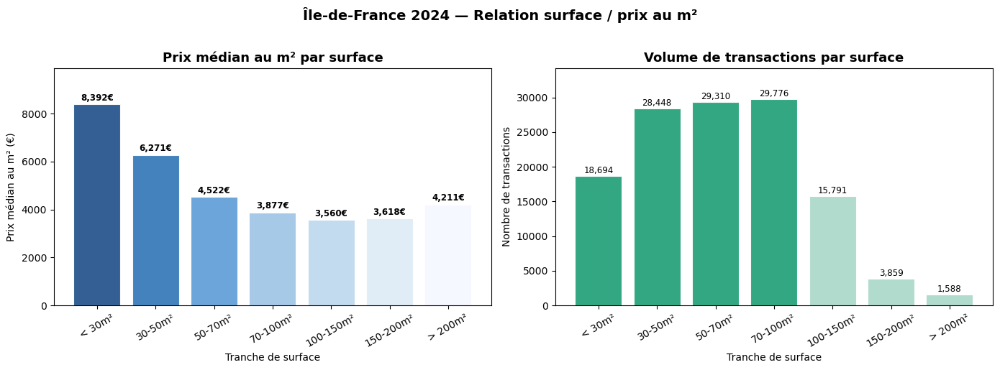

In [9]:
# DVF2-3 — Visualisation corrélation prix / surface
import matplotlib.pyplot as plt
import numpy as np

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

couleurs = ["#1D4E89", "#2E75B6", "#5B9BD5", "#9DC3E6", 
            "#BDD7EE", "#DDEBF7", "#F4F9FF"]

# Graphique 1 — Prix médian par tranche de surface
bars = axes[0].bar(stats.index, stats["prix_median"], 
                   color=couleurs, alpha=0.9, edgecolor="white", linewidth=0.8)

for bar, val in zip(bars, stats["prix_median"]):
    axes[0].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 80,
                f"{val:,.0f}€", ha="center", va="bottom", fontsize=8.5, fontweight="bold")

axes[0].set_title("Prix médian au m² par surface", fontsize=13, fontweight="bold")
axes[0].set_xlabel("Tranche de surface")
axes[0].set_ylabel("Prix médian au m² (€)")
axes[0].set_ylim(0, stats["prix_median"].max() * 1.18)
axes[0].tick_params(axis="x", rotation=30)

# Graphique 2 — Nombre de transactions par tranche
couleurs2 = ["#1D9E75" if i < 4 else "#A8D8C8" for i in range(len(stats))]
bars2 = axes[1].bar(stats.index, stats["nombre"], 
                    color=couleurs2, alpha=0.9, edgecolor="white", linewidth=0.8)

for bar, val in zip(bars2, stats["nombre"]):
    axes[1].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 100,
                f"{val:,}", ha="center", va="bottom", fontsize=8.5)

axes[1].set_title("Volume de transactions par surface", fontsize=13, fontweight="bold")
axes[1].set_xlabel("Tranche de surface")
axes[1].set_ylabel("Nombre de transactions")
axes[1].set_ylim(0, stats["nombre"].max() * 1.15)
axes[1].tick_params(axis="x", rotation=30)

plt.suptitle("Île-de-France 2024 — Relation surface / prix au m²", 
             fontsize=14, fontweight="bold", y=1.02)
plt.tight_layout()
plt.show()

In [10]:
# DVF2-4 — Comparaison entre départements

# Nom complet de chaque département
noms_dept = {
    "75": "Paris",
    "92": "Hauts-de-Seine",
    "93": "Seine-St-Denis",
    "94": "Val-de-Marne",
    "77": "Seine-et-Marne",
    "78": "Yvelines",
    "91": "Essonne",
    "95": "Val-d'Oise"
}

# Statistiques par département
stats_dept = df.groupby("departement")["prix_m2"].agg(
    nombre="count",
    prix_median="median",
    prix_moyen="mean"
).round(0).reset_index()

# Ajouter les noms complets
stats_dept["nom"] = stats_dept["departement"].map(noms_dept)

# Trier par prix médian décroissant
stats_dept = stats_dept.sort_values("prix_median", ascending=False)

print("=== Prix au m² par département — IDF 2024 ===")
print(stats_dept[["nom", "nombre", "prix_median", "prix_moyen"]].to_string(index=False))

=== Prix au m² par département — IDF 2024 ===
nom  nombre  prix_median  prix_moyen
NaN   27912       9800.0     10952.0
NaN   16274       6638.0      7628.0
NaN   13510       5154.0      6739.0
NaN   13892       4333.0      7544.0
NaN   14501       3947.0      4971.0
NaN   11667       3517.0      4763.0
NaN   13201       3253.0      4218.0
NaN   16509       3107.0      4129.0


In [11]:
# Diagnostic
print("Type de la colonne departement :", df["departement"].dtype)
print("Valeurs uniques :", df["departement"].unique())

Type de la colonne departement : int64
Valeurs uniques : [75 92 93 94 77 78 91 95]


In [12]:
# Correction — dictionnaire avec des nombres entiers comme clés
noms_dept = {
    75: "Paris",
    92: "Hauts-de-Seine",
    93: "Seine-St-Denis",
    94: "Val-de-Marne",
    77: "Seine-et-Marne",
    78: "Yvelines",
    91: "Essonne",
    95: "Val-d'Oise"
}

# Statistiques par département
stats_dept = df.groupby("departement")["prix_m2"].agg(
    nombre="count",
    prix_median="median",
    prix_moyen="mean"
).round(0).reset_index()

# Ajouter les noms complets
stats_dept["nom"] = stats_dept["departement"].map(noms_dept)

# Trier par prix médian décroissant
stats_dept = stats_dept.sort_values("prix_median", ascending=False)

print("=== Prix au m² par département — IDF 2024 ===")
print(stats_dept[["nom", "nombre", "prix_median", "prix_moyen"]].to_string(index=False))

=== Prix au m² par département — IDF 2024 ===
           nom  nombre  prix_median  prix_moyen
         Paris   27912       9800.0     10952.0
Hauts-de-Seine   16274       6638.0      7628.0
  Val-de-Marne   13510       5154.0      6739.0
Seine-St-Denis   13892       4333.0      7544.0
      Yvelines   14501       3947.0      4971.0
    Val-d'Oise   11667       3517.0      4763.0
       Essonne   13201       3253.0      4218.0
Seine-et-Marne   16509       3107.0      4129.0


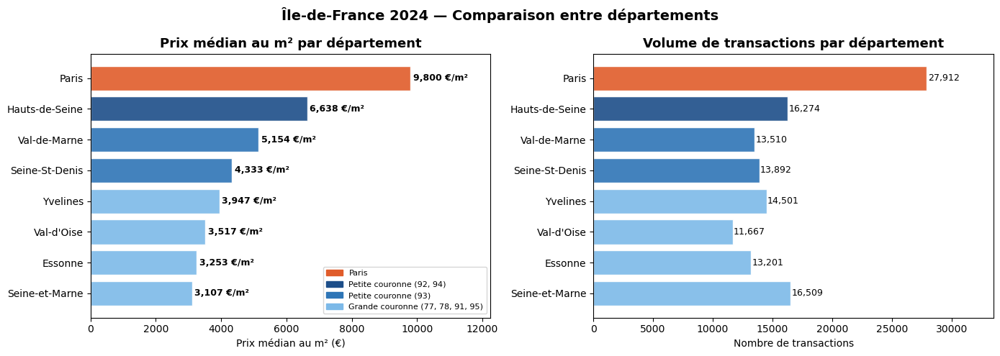

In [13]:
# DVF2-4 — Visualisation par département
import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Couleurs — Paris en orange, petite couronne en bleu foncé, grande couronne en bleu clair
couleurs = {
    "Paris": "#E05C2A",
    "Hauts-de-Seine": "#1D4E89",
    "Val-de-Marne": "#2E75B6",
    "Seine-St-Denis": "#2E75B6",
    "Yvelines": "#7CB9E8",
    "Val-d'Oise": "#7CB9E8",
    "Essonne": "#7CB9E8",
    "Seine-et-Marne": "#7CB9E8"
}

colors = [couleurs[nom] for nom in stats_dept["nom"]]

# Graphique 1 — Prix médian par département
bars = axes[0].barh(stats_dept["nom"], stats_dept["prix_median"],
                    color=colors, alpha=0.9, edgecolor="white")

for bar, val in zip(bars, stats_dept["prix_median"]):
    axes[0].text(bar.get_width() + 80, bar.get_y() + bar.get_height()/2,
                f"{val:,.0f} €/m²", va="center", fontsize=9, fontweight="bold")

axes[0].set_title("Prix médian au m² par département", fontsize=13, fontweight="bold")
axes[0].set_xlabel("Prix médian au m² (€)")
axes[0].set_xlim(0, stats_dept["prix_median"].max() * 1.25)
axes[0].invert_yaxis()

# Graphique 2 — Volume de transactions
bars2 = axes[1].barh(stats_dept["nom"], stats_dept["nombre"],
                     color=colors, alpha=0.9, edgecolor="white")

for bar, val in zip(bars2, stats_dept["nombre"]):
    axes[1].text(bar.get_width() + 80, bar.get_y() + bar.get_height()/2,
                f"{val:,}", va="center", fontsize=9)

axes[1].set_title("Volume de transactions par département", fontsize=13, fontweight="bold")
axes[1].set_xlabel("Nombre de transactions")
axes[1].set_xlim(0, stats_dept["nombre"].max() * 1.2)
axes[1].invert_yaxis()

# Légende manuelle
from matplotlib.patches import Patch
legende = [
    Patch(color="#E05C2A", label="Paris"),
    Patch(color="#1D4E89", label="Petite couronne (92, 94)"),
    Patch(color="#2E75B6", label="Petite couronne (93)"),
    Patch(color="#7CB9E8", label="Grande couronne (77, 78, 91, 95)"),
]
axes[0].legend(handles=legende, fontsize=8, loc="lower right")

plt.suptitle("Île-de-France 2024 — Comparaison entre départements",
             fontsize=14, fontweight="bold")
plt.tight_layout()
plt.show()

In [14]:
# DVF2-5 — Détection des outliers

# Méthode IQR (Interquartile Range) — la méthode standard
Q1 = df["prix_m2"].quantile(0.25)
Q3 = df["prix_m2"].quantile(0.75)
IQR = Q3 - Q1

borne_basse = Q1 - 1.5 * IQR
borne_haute = Q3 + 1.5 * IQR

outliers = df[(df["prix_m2"] < borne_basse) | (df["prix_m2"] > borne_haute)]
normaux  = df[(df["prix_m2"] >= borne_basse) & (df["prix_m2"] <= borne_haute)]

print("=== Analyse des outliers — prix au m² ===")
print(f"Q1 (25%) : {Q1:,.0f} €/m²")
print(f"Q3 (75%) : {Q3:,.0f} €/m²")
print(f"IQR      : {IQR:,.0f} €/m²")
print(f"\nBorne basse : {borne_basse:,.0f} €/m²")
print(f"Borne haute : {borne_haute:,.0f} €/m²")
print(f"\nTransactions normales : {len(normaux):,} ({len(normaux)/len(df)*100:.1f}%)")
print(f"Outliers détectés     : {len(outliers):,} ({len(outliers)/len(df)*100:.1f}%)")
print(f"\nTop 10 outliers les plus chers :")
print(df.nlargest(10, "prix_m2")[["nom_commune", "type_local", 
                                   "surface_reelle_bati", 
                                   "valeur_fonciere", "prix_m2"]].to_string(index=False))

=== Analyse des outliers — prix au m² ===
Q1 (25%) : 3,238 €/m²
Q3 (75%) : 8,462 €/m²
IQR      : 5,223 €/m²

Borne basse : -4,597 €/m²
Borne haute : 16,297 €/m²

Transactions normales : 120,806 (94.8%)
Outliers détectés     : 6,660 (5.2%)

Top 10 outliers les plus chers :
             nom_commune  type_local  surface_reelle_bati  valeur_fonciere  prix_m2
Paris 19e Arrondissement      Maison                 85.0        4250000.0  50000.0
Paris 20e Arrondissement Appartement                 34.0        1700000.0  50000.0
Paris 20e Arrondissement Appartement                 34.0        1700000.0  50000.0
 Paris 4e Arrondissement Appartement                220.0       11000000.0  50000.0
 Paris 8e Arrondissement Appartement                 38.0        1900000.0  50000.0
 Paris 3e Arrondissement Appartement                 34.0        1700000.0  50000.0
Paris 18e Arrondissement Appartement                 26.0        1300000.0  50000.0
                Nanterre Appartement                 32

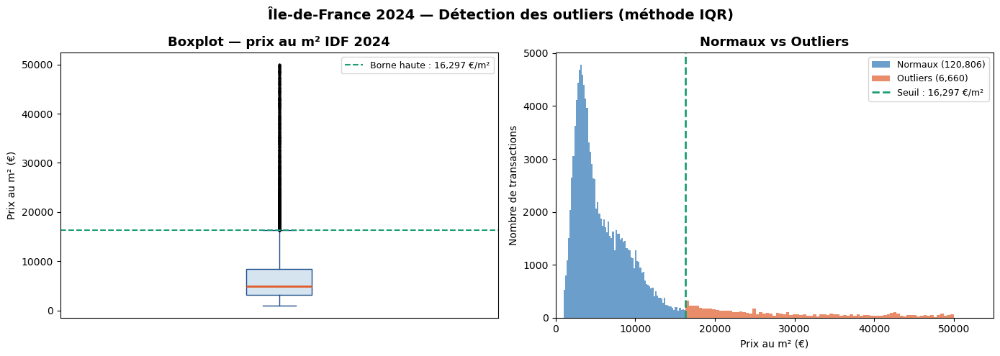

In [15]:
# DVF2-5 — Visualisation des outliers
import matplotlib.pyplot as plt
import numpy as np

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Graphique 1 — Boxplot avec outliers visibles
axes[0].boxplot(df["prix_m2"], vert=True, patch_artist=True,
                boxprops=dict(facecolor="#D6E4F0", color="#1D4E89"),
                medianprops=dict(color="#E05C2A", linewidth=2),
                flierprops=dict(marker=".", color="#E05C2A", 
                                alpha=0.3, markersize=3),
                whiskerprops=dict(color="#1D4E89"),
                capprops=dict(color="#1D4E89"))

axes[0].axhline(borne_haute, color="#1D9E75", linestyle="--", 
                linewidth=1.5, label=f"Borne haute : {borne_haute:,.0f} €/m²")
axes[0].set_title("Boxplot — prix au m² IDF 2024", 
                  fontsize=13, fontweight="bold")
axes[0].set_ylabel("Prix au m² (€)")
axes[0].legend(fontsize=9)
axes[0].set_xticks([])

# Graphique 2 — Distribution normaux vs outliers
axes[1].hist(normaux["prix_m2"], bins=80, alpha=0.7, 
             color="#2E75B6", label=f"Normaux ({len(normaux):,})")
axes[1].hist(outliers["prix_m2"], bins=80, alpha=0.7, 
             color="#E05C2A", label=f"Outliers ({len(outliers):,})")

axes[1].axvline(borne_haute, color="#1D9E75", linestyle="--", 
                linewidth=2, label=f"Seuil : {borne_haute:,.0f} €/m²")

axes[1].set_title("Normaux vs Outliers", fontsize=13, fontweight="bold")
axes[1].set_xlabel("Prix au m² (€)")
axes[1].set_ylabel("Nombre de transactions")
axes[1].legend(fontsize=9)
axes[1].set_xlim(0, 55000)

plt.suptitle("Île-de-France 2024 — Détection des outliers (méthode IQR)",
             fontsize=14, fontweight="bold")
plt.tight_layout()
plt.show()

In [16]:
# Vérification et installation de Folium
try:
    import folium
    print(f"✅ Folium installé — version {folium.__version__}")
except ImportError:
    print("⚠️ Folium non installé — installation en cours...")
    import subprocess
    subprocess.run(["pip", "install", "folium"])
    import folium
    print(f"✅ Folium installé — version {folium.__version__}")

⚠️ Folium non installé — installation en cours...
✅ Folium installé — version 0.20.0


In [17]:
# Chargement des données
import pandas as pd
import folium

df = pd.read_csv("data/idf_propre.csv")
print(f"✅ {len(df):,} transactions chargées")

✅ 127,466 transactions chargées


In [18]:
# DVF3-1 — Première carte : centre de l'IDF
# On crée une carte centrée sur Paris
carte = folium.Map(
    location=[48.8566, 2.3522],  # Coordonnées GPS de Paris
    zoom_start=10,               # Niveau de zoom initial
    tiles="CartoDB positron"     # Style de carte — épuré et professionnel
)

# On affiche la carte
carte

In [19]:
# DVF3-1 — Carte choroplèthe prix médian par département

import folium
import pandas as pd
import json
import urllib.request

# Télécharger les contours géographiques des départements IDF
url_geojson = "https://raw.githubusercontent.com/gregoiredavid/france-geojson/master/departements.geojson"
urllib.request.urlretrieve(url_geojson, "data/departements.geojson")
print("✅ Contours géographiques téléchargés")

# Calculer le prix médian par département
prix_dept = df.groupby("departement")["prix_m2"].median().round(0).reset_index()
prix_dept.columns = ["departement", "prix_median"]
prix_dept["departement"] = prix_dept["departement"].astype(str)

print("\nPrix médian par département :")
print(prix_dept.to_string(index=False))

✅ Contours géographiques téléchargés

Prix médian par département :
departement  prix_median
         75       9800.0
         77       3107.0
         78       3947.0
         91       3253.0
         92       6638.0
         93       4333.0
         94       5154.0
         95       3517.0


In [20]:
# DVF3-1 — Carte choroplèthe interactive

# Créer la carte de base
carte = folium.Map(
    location=[48.7, 2.5],
    zoom_start=9,
    tiles="CartoDB positron"
)

# Ajouter la couche choroplèthe
folium.Choropleth(
    geo_data="data/departements.geojson",
    name="Prix au m²",
    data=prix_dept,
    columns=["departement", "prix_median"],
    key_on="feature.properties.code",
    fill_color="YlOrRd",        # Jaune → Orange → Rouge
    fill_opacity=0.75,
    line_opacity=0.5,
    legend_name="Prix médian au m² (€)",
    highlight=True,
    nan_fill_color="lightgray"  # Départements hors IDF en gris
).add_to(carte)

# Ajouter les étiquettes avec le prix sur chaque département
noms_dept = {
    "75": "Paris", "92": "Hauts-de-Seine",
    "93": "Seine-St-Denis", "94": "Val-de-Marne",
    "77": "Seine-et-Marne", "78": "Yvelines",
    "91": "Essonne", "95": "Val-d'Oise"
}

coordonnees = {
    "75": [48.8566, 2.3522],
    "92": [48.8300, 2.2500],
    "93": [48.9200, 2.4800],
    "94": [48.7800, 2.4700],
    "77": [48.6000, 2.9000],
    "78": [48.8000, 1.8500],
    "91": [48.5000, 2.3000],
    "95": [49.0800, 2.1000]
}

for _, row in prix_dept.iterrows():
    dept = row["departement"]
    if dept in coordonnees:
        folium.Marker(
            location=coordonnees[dept],
            icon=folium.DivIcon(
                html=f"""
                <div style="
                    background-color: white;
                    border: 2px solid #333;
                    border-radius: 6px;
                    padding: 4px 8px;
                    font-size: 11px;
                    font-weight: bold;
                    font-family: Arial;
                    white-space: nowrap;
                    box-shadow: 2px 2px 4px rgba(0,0,0,0.3);
                ">
                    {noms_dept[dept]}<br>
                    <span style="color:#E05C2A">{row['prix_median']:,.0f} €/m²</span>
                </div>
                """,
                icon_size=(120, 40),
                icon_anchor=(60, 20)
            )
        ).add_to(carte)

# Sauvegarder en HTML
carte.save("data/carte_prix_idf.html")
print("✅ Carte sauvegardée : data/carte_prix_idf.html")

# Afficher dans Jupyter
carte

✅ Carte sauvegardée : data/carte_prix_idf.html


In [21]:
# DVF3-1 — Version corrigée

# Coordonnées mieux espacées
coordonnees = {
    "75": [48.8566, 2.3522],   # Paris
    "92": [48.8200, 2.1800],   # Hauts-de-Seine — décalé à gauche
    "93": [48.9400, 2.5500],   # Seine-St-Denis — décalé à droite
    "94": [48.7600, 2.5800],   # Val-de-Marne — décalé bas droite
    "77": [48.5500, 2.9500],   # Seine-et-Marne
    "78": [48.8000, 1.7000],   # Yvelines
    "91": [48.4500, 2.2000],   # Essonne
    "95": [49.0500, 2.0500]    # Val-d'Oise
}

noms_dept = {
    "75": "Paris", "92": "Hauts-de-Seine",
    "93": "Seine-St-Denis", "94": "Val-de-Marne",
    "77": "Seine-et-Marne", "78": "Yvelines",
    "91": "Essonne", "95": "Val-d'Oise"
}

# Couleurs selon le prix
def couleur_prix(prix):
    if prix >= 8000:   return "#C0392B"   # Rouge foncé — très cher
    elif prix >= 6000: return "#E74C3C"   # Rouge — cher
    elif prix >= 5000: return "#E67E22"   # Orange foncé
    elif prix >= 4000: return "#F39C12"   # Orange
    else:              return "#27AE60"   # Vert — accessible

carte = folium.Map(
    location=[48.7, 2.4],
    zoom_start=9,
    tiles="CartoDB positron"
)

# Ajouter un cercle coloré + étiquette pour chaque département
for _, row in prix_dept.iterrows():
    dept = row["departement"]
    prix = row["prix_median"]
    coords = coordonnees[dept]
    nom = noms_dept[dept]
    couleur = couleur_prix(prix)

    # Cercle coloré
    folium.CircleMarker(
        location=coords,
        radius=30,
        color=couleur,
        fill=True,
        fill_color=couleur,
        fill_opacity=0.85,
        popup=folium.Popup(f"<b>{nom}</b><br>Prix médian : {prix:,.0f} €/m²", max_width=200)
    ).add_to(carte)

    # Étiquette avec prix
    folium.Marker(
        location=coords,
        icon=folium.DivIcon(
            html=f"""
            <div style="
                font-family: Arial;
                font-size: 10px;
                font-weight: bold;
                color: white;
                text-align: center;
                margin-top: -35px;
            ">
                {nom}<br>{prix:,.0f}€
            </div>
            """,
            icon_size=(100, 40),
            icon_anchor=(50, 0)
        )
    ).add_to(carte)

# Légende manuelle
legende_html = """
<div style="
    position: fixed; bottom: 30px; left: 30px;
    background: white; padding: 12px;
    border-radius: 8px; border: 1px solid #ccc;
    font-family: Arial; font-size: 12px;
    box-shadow: 2px 2px 6px rgba(0,0,0,0.2);
    z-index: 1000;
">
    <b>Prix médian au m²</b><br><br>
    <span style="color:#C0392B">●</span> Plus de 8 000 €<br>
    <span style="color:#E74C3C">●</span> 6 000 — 8 000 €<br>
    <span style="color:#E67E22">●</span> 5 000 — 6 000 €<br>
    <span style="color:#F39C12">●</span> 4 000 — 5 000 €<br>
    <span style="color:#27AE60">●</span> Moins de 4 000 €
</div>
"""
carte.get_root().html.add_child(folium.Element(legende_html))

carte.save("data/carte_prix_idf.html")
print("✅ Carte sauvegardée !")
carte

✅ Carte sauvegardée !


In [22]:
# Installation du plugin heatmap pour Folium
try:
    from folium.plugins import HeatMap
    print("✅ Plugin HeatMap disponible")
except ImportError:
    import subprocess
    subprocess.run(["pip", "install", "folium", "--upgrade"])
    from folium.plugins import HeatMap
    print("✅ Plugin installé")

✅ Plugin HeatMap disponible


In [23]:
# DVF3-2 — Heatmap de densité des transactions

from folium.plugins import HeatMap
import folium

# On garde uniquement les lignes avec des coordonnées GPS valides
df_geo = df.dropna(subset=["latitude", "longitude"])
print(f"Transactions avec GPS : {len(df_geo):,}")

# On prépare les données pour la heatmap
# Format attendu : liste de [latitude, longitude, intensité]
points = df_geo[["latitude", "longitude", "prix_m2"]].values.tolist()

# Créer la carte
carte_heatmap = folium.Map(
    location=[48.7, 2.4],
    zoom_start=10,
    tiles="CartoDB dark_matter"  # Fond sombre — la heatmap ressort mieux
)

# Ajouter la heatmap
HeatMap(
    points,
    radius=8,          # Taille de chaque point
    blur=10,           # Niveau de flou
    min_opacity=0.4,   # Opacité minimale
    max_zoom=13,       # Zoom maximum de la heatmap
).add_to(carte_heatmap)

# Titre
titre_html = """
<div style="
    position: fixed; top: 20px; left: 50%;
    transform: translateX(-50%);
    background: rgba(0,0,0,0.7);
    color: white; padding: 10px 20px;
    border-radius: 8px;
    font-family: Arial; font-size: 14px;
    font-weight: bold; z-index: 1000;
">
    Densité des transactions immobilières — IDF 2024
</div>
"""
carte_heatmap.get_root().html.add_child(folium.Element(titre_html))

carte_heatmap.save("data/heatmap_transactions.html")
print("✅ Heatmap sauvegardée !")
carte_heatmap

Transactions avec GPS : 126,439
✅ Heatmap sauvegardée !


In [24]:
# Préparation des données par commune
stats_communes = df.groupby("nom_commune").agg(
    prix_median=("prix_m2", "median"),
    nombre=("prix_m2", "count"),
    latitude=("latitude", "mean"),
    longitude=("longitude", "mean")
).round(1).reset_index()

# Garder uniquement les communes avec au moins 10 transactions
stats_communes = stats_communes[stats_communes["nombre"] >= 10]

print(f"✅ {len(stats_communes)} communes avec au moins 10 transactions")
print("\nTop 10 communes les plus chères :")
print(stats_communes.nlargest(10, "prix_median")[
    ["nom_commune", "prix_median", "nombre"]
].to_string(index=False))

✅ 860 communes avec au moins 10 transactions

Top 10 communes les plus chères :
             nom_commune  prix_median  nombre
            Frémainville      40454.5      42
              Amenucourt      14949.5      12
 Paris 6e Arrondissement      14848.5     773
 Paris 7e Arrondissement      14331.1     899
 Paris 4e Arrondissement      12840.0     497
                Bagnolet      12548.2    1742
Paris 1er Arrondissement      12392.9     282
 Paris 8e Arrondissement      12222.2     719
 Paris 5e Arrondissement      11944.4     863
 Paris 3e Arrondissement      11902.4     624


In [25]:
# DVF3-3 — Carte interactive par commune

# Filtrer les communes avec au moins 30 transactions
stats_communes = stats_communes[stats_communes["nombre"] >= 30].copy()
print(f"✅ {len(stats_communes)} communes retenues")

# Fonction couleur selon le prix
def couleur_commune(prix):
    if prix >= 10000:  return "#C0392B"
    elif prix >= 7000: return "#E74C3C"
    elif prix >= 5000: return "#E67E22"
    elif prix >= 4000: return "#F39C12"
    elif prix >= 3000: return "#2ECC71"
    else:              return "#27AE60"

# Créer la carte
carte_communes = folium.Map(
    location=[48.7, 2.4],
    zoom_start=10,
    tiles="CartoDB positron"
)

# Ajouter un cercle par commune
for _, row in stats_communes.iterrows():
    couleur = couleur_commune(row["prix_median"])
    
    folium.CircleMarker(
        location=[row["latitude"], row["longitude"]],
        radius=max(5, min(15, row["nombre"] / 100)),  # Taille selon le volume
        color=couleur,
        fill=True,
        fill_color=couleur,
        fill_opacity=0.7,
        popup=folium.Popup(
            f"""
            <div style="font-family:Arial; font-size:13px; min-width:180px">
                <b>{row['nom_commune']}</b><br>
                <hr style="margin:4px 0">
                Prix médian : <b>{row['prix_median']:,.0f} €/m²</b><br>
                Transactions : {row['nombre']:,}
            </div>
            """,
            max_width=220
        ),
        tooltip=f"{row['nom_commune']} — {row['prix_median']:,.0f} €/m²"
    ).add_to(carte_communes)

# Légende
legende_html = """
<div style="
    position: fixed; bottom: 30px; left: 30px;
    background: white; padding: 14px;
    border-radius: 8px; border: 1px solid #ccc;
    font-family: Arial; font-size: 12px;
    box-shadow: 2px 2px 6px rgba(0,0,0,0.2);
    z-index: 1000;
">
    <b>Prix médian au m²</b><br>
    <i style="font-size:10px">Taille = volume de transactions</i><br><br>
    <span style="color:#C0392B">●</span> Plus de 10 000 €<br>
    <span style="color:#E74C3C">●</span> 7 000 — 10 000 €<br>
    <span style="color:#E67E22">●</span> 5 000 — 7 000 €<br>
    <span style="color:#F39C12">●</span> 4 000 — 5 000 €<br>
    <span style="color:#2ECC71">●</span> 3 000 — 4 000 €<br>
    <span style="color:#27AE60">●</span> Moins de 3 000 €
</div>
"""
carte_communes.get_root().html.add_child(folium.Element(legende_html))

carte_communes.save("data/carte_communes_idf.html")
print("✅ Carte sauvegardée !")
carte_communes

✅ 538 communes retenues


ValueError: Location values cannot contain NaNs.

In [26]:
# DVF3-3 — Version corrigée

# Supprimer les communes sans coordonnées GPS
stats_communes = stats_communes.dropna(subset=["latitude", "longitude"])
print(f"✅ {len(stats_communes)} communes avec coordonnées GPS valides")

# Fonction couleur selon le prix
def couleur_commune(prix):
    if prix >= 10000:  return "#C0392B"
    elif prix >= 7000: return "#E74C3C"
    elif prix >= 5000: return "#E67E22"
    elif prix >= 4000: return "#F39C12"
    elif prix >= 3000: return "#2ECC71"
    else:              return "#27AE60"

# Créer la carte
carte_communes = folium.Map(
    location=[48.7, 2.4],
    zoom_start=10,
    tiles="CartoDB positron"
)

# Ajouter un cercle par commune
for _, row in stats_communes.iterrows():
    couleur = couleur_commune(row["prix_median"])
    
    folium.CircleMarker(
        location=[row["latitude"], row["longitude"]],
        radius=max(5, min(15, row["nombre"] / 100)),
        color=couleur,
        fill=True,
        fill_color=couleur,
        fill_opacity=0.7,
        popup=folium.Popup(
            f"""
            <div style="font-family:Arial; font-size:13px; min-width:180px">
                <b>{row['nom_commune']}</b><br>
                <hr style="margin:4px 0">
                Prix médian : <b>{row['prix_median']:,.0f} €/m²</b><br>
                Transactions : {row['nombre']:,}
            </div>
            """,
            max_width=220
        ),
        tooltip=f"{row['nom_commune']} — {row['prix_median']:,.0f} €/m²"
    ).add_to(carte_communes)

# Légende
legende_html = """
<div style="
    position: fixed; bottom: 30px; left: 30px;
    background: white; padding: 14px;
    border-radius: 8px; border: 1px solid #ccc;
    font-family: Arial; font-size: 12px;
    box-shadow: 2px 2px 6px rgba(0,0,0,0.2);
    z-index: 1000;
">
    <b>Prix médian au m²</b><br>
    <i style="font-size:10px">Taille = volume de transactions</i><br><br>
    <span style="color:#C0392B">●</span> Plus de 10 000 €<br>
    <span style="color:#E74C3C">●</span> 7 000 — 10 000 €<br>
    <span style="color:#E67E22">●</span> 5 000 — 7 000 €<br>
    <span style="color:#F39C12">●</span> 4 000 — 5 000 €<br>
    <span style="color:#2ECC71">●</span> 3 000 — 4 000 €<br>
    <span style="color:#27AE60">●</span> Moins de 3 000 €
</div>
"""
carte_communes.get_root().html.add_child(folium.Element(legende_html))

carte_communes.save("data/carte_communes_idf.html")
print("✅ Carte sauvegardée !")
carte_communes

✅ 536 communes avec coordonnées GPS valides
✅ Carte sauvegardée !
